<center><img src="https://github.com/insaid2018/Term-1/blob/master/Images/INSAID_Full%20Logo.png?raw=true" width="240" height="100" /></center>

---
# **Table of Contents**
---

**1.** [**Introduction**](#Section1)<br>
**2.** [**Problem Statement**](#Section2)<br>
**3.** [**Installing & Importing Libraries**](#Section3)<br>
  - **3.1** [**Installing Libraries**](#Section31)
  - **3.2** [**Upgrading Libraries**](#Section32)
  - **3.3** [**Importing Libraries**](#Section33)

**4.** [**Data Acquisition & Description**](#Section4)<br>
  - **4.1** [**Data acquisition**](#Section41)
  - **4.2** [**Data description and information**](#Section42)

**5.** [**Data Pre-processing**](#Section5)<br>
  - **5.1** [**Data Pre-profiling**](#Section51)<br>
  
**6.** [**Exploratory Data Analysis**](#Section6)<br>

**7.** [**Post Data Processing**](#Section7)<br>
  - **7.1** [**Data Encoding**](#Section71)<br> 
  - **7.2** [**Data Scaling**](#Section72)<br>
  - **7.3** [**Data Preparation**](#Section73)<br>

**8.** [**Model Development & Evaluation**](#Section8)<br>
**9.** [**Summarization**](#Section9)<br>
  - **9.1** [**Conclusion**](#Section91)<br>
  - **9.2** [**Actionable Insights**](#Section92)<br>

---
<a name = Section1></a>
# **1. Introduction**
---

- **KPP**  is a leading Telecom company with 5 million users.

- They intend to keep track of number of male and female users but are overwhelmed by the amount of data.

- They want to automate the process by making use of their **voice**.

- Their research and development teams are trying to understand the acoustic properties of the voice and speech so that they can use it to **enhance the customer experience** in their new product.


---
<a name = Section2></a>
# **2. Problem Statement**
---

- Often, the human ear can easily detect the difference between a male or a female voice within the first few spoken words.

- However, designing a computer program to do this turns out to be a bit trickier.

- Currently, the company is keeping track by manually entering the data for the user being male or female by listening to their voice which is a tedious task for the employees.

<a name = Section21></a>
### **Scenario**

- The current process suffers from the following problems:

    - The current process is a manual classification of gender using their voice.
    
    - This is very tedious and time-consuming as it needs to be repeated every time a new customer joins.

- **Objective**:

    - Given is a dataset consisting of recorded voice samples, collected from male and female speakers.

    - Task is to build a classification model using the dataset.


---
<a name = Section3></a>
# **3. Installing & Importing Libraries**
---

<a name = Section31></a>
### **3.1 Installing Libraries**

In [6]:
#!pip install -q datascience                                         # Package that is required by pandas profiling
#!pip install -q pandas-profiling                                    # Library to generate basic statistics about data
!pip install -q yellowbrick                                         # Toolbox for Measuring Machine Performance

<a name = Section32></a>
### **3.2 Upgrading Libraries**

- **After upgrading** the libraries, you need to **restart the runtime** to make the libraries in sync. 

- Make sure not to execute the cell above (3.1) and below (3.2) again after restarting the runtime.

In [7]:
!pip install -q --upgrade pandas-profiling
!pip install -q --upgrade yellowbrick

<a name = Section33></a>
### **3.3 Importing Libraries**

In [2]:
#------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis)
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
import seaborn as sns                                               # Importin seaborm library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.preprocessing import StandardScaler                    # To scaled data with mean 0 and variance 1
from sklearn.model_selection import train_test_split                # To split the data in training and testing part
from sklearn.tree import DecisionTreeClassifier                     # To implement decision tree classifier
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report                   # To generate classification report
from sklearn.metrics import plot_confusion_matrix                   # To plot confusion matrix
#import pydotplus                                                    # To generate pydot file
from IPython.display import Image                                   # To generate image using pydot file
from sklearn.model_selection import GridSearchCV                    # To find best hyperparamter setting for the algorithm
#-------------------------------------------------------------------------------------------------------------------------------
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

---
<a name = Section4></a>
# **4. Data Acquisition & Description**
---

  | Column Name  | Description |
    | ------------- | ------------- |
|ID	|Unique Id|
|meanfreq	|Mean frequency (in kHz) for the voice sample|
|sd	S|tandard deviation of the frequency|
|median	|Median frequency (in kHz) for the voice sample|
|Q25	|First quantile (in kHz)|
|Q75	|Third quantile (in kHz)|
|IQR	|Interquartile range (in kHz)|
|skew	|Skewness of the voice sample|
|kurt	|Kurtosis of the voice sample|
|sp.ent	|Spectral entropy|
|sfm	|Spectral flatness of the voice sample|
|mode	|Mode frequency|
|centroid	|Frequency centroid|
|peakf	|Peak frequency (the frequency with the highest energy)|
|meanfun	|Average of fundamental frequency measured across the acoustic signal|
|minfun	|Minimum fundamental frequency measured across the acoustic signal|
|maxfun	|Maximum fundamental frequency measured across the acoustic signal|
|meandom	|Average of dominant frequency measured across the acoustic signal|
|mindom	|Minimum of dominant frequency measured across the acoustic signal|
|maxdom	|Maximum of dominant frequency measured across the acoustic signal|
|dfrange	|Range of dominant frequency measured across the acoustic signal|
|modindx	|Modulation index. Calculated as the accumulated absolute difference between adjacent Measurements of fundamental frequencies divided by the frequency range|
|label	|The label for the voice sample (male or female)|

    

<a name = Section41></a>
# **4.1 Data Acquisition**

In [3]:

---
# Load the data
train_data = pd.read_csv('voice_train.csv')
test_data = pd.read_csv('voice_test.csv')
# Get the dimesions of data
print('Shape of the Train dataset:', train_data.shape)
print('Shape of the Test dataset:', test_data.shape)
train_data.head()

Shape of the Train dataset: (2851, 22)
Shape of the Test dataset: (317, 21)


,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,765,0.162337,0.058206,0.174065,0.100225,0.196512,0.096287,2.127226,7.815129,0.921533,0.426868,0.195134,0.162337,0.095852,0.016754,0.235294,0.406033,0.046875,3.484375,3.437500,0.155348,male
1,3071,0.161653,0.057435,0.170138,0.157522,0.182929,0.025407,6.968850,60.968047,0.870409,0.459881,0.171014,0.161653,0.163486,0.015601,0.204082,0.595161,0.170898,3.979492,3.808594,0.209073,female
2,1546,0.165290,0.061891,0.135071,0.118468,0.225176,0.106708,2.631865,12.629116,0.918897,0.413620,0.129191,0.165290,0.120050,0.035088,0.222222,0.458577,0.087891,1.015625,0.927734,0.459834,male
3,410,0.188100,0.055735,0.206028,0.130493,0.229470,0.098977,1.538406,5.145753,0.914325,0.398674,0.222698,0.188100,0.108470,0.021305,0.145455,0.493229,0.125000,4.734375,4.609375,0.105202,male
4,2689,0.187497,0.044226,0.190071,0.156800,0.215435,0.058635,1.653083,5.839465,0.907477,0.337921,0.196000,0.187497,0.154529,0.048338,0.279070,1.113502,0.023438,8.765625,8.742188,0.103095,female


In [4]:
#Storing the id from the test data set
store_id=test_data.Id

<a name = Section42></a>
# **4.2 Data Description and information**

In [5]:
train_data.describe()

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000
mean,1591.565416,0.180923,0.057143,0.185722,0.140349,0.224730,0.084381,3.118469,35.808329,0.895312,0.408473,0.165481,0.180923,0.142891,0.036834,0.258968,0.833608,0.052634,5.075745,5.023111,0.173933
std,909.939169,0.029796,0.016588,0.036175,0.048628,0.023509,0.042728,4.163727,131.430900,0.044795,0.176880,0.076918,0.029796,0.032191,0.019182,0.029806,0.525565,0.062982,3.526201,3.525193,0.119463
min,1.000000,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.108696,0.007812,0.004883,0.007812,0.000000,0.000000
25%,808.500000,0.163739,0.042082,0.169726,0.111139,0.208756,0.042663,1.638410,5.604497,0.862190,0.259191,0.118100,0.163739,0.117578,0.018223,0.253968,0.423799,0.007812,2.207031,2.183594,0.099591
50%,1590.000000,0.184848,0.059151,0.190067,0.140229,0.225729,0.094235,2.183320,8.255809,0.901840,0.396548,0.186667,0.184848,0.140678,0.046921,0.271186,0.767578,0.023438,4.992188,4.968750,0.139159
75%,2382.500000,0.199061,0.066891,0.210650,0.175690,0.243700,0.114208,2.932962,13.649354,0.928727,0.533495,0.221341,0.199061,0.169593,0.047904,0.277457,1.180411,0.070312,7.078125,7.042969,0.209525
max,3167.000000,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


In [6]:
train_data.describe(include=['object'])

,label
count,2851
unique,2
top,female
freq,1432


In [7]:
train_data.skew()

Id         -0.001228
meanfreq   -0.608137
sd          0.145654
median     -1.015778
Q25        -0.495925
Q75        -0.821695
IQR         0.299418
skew        4.946760
kurt        5.881449
sp.ent     -0.429966
sfm         0.350951
mode       -0.839555
centroid   -0.608137
meanfun     0.032909
minfun      1.916373
maxfun     -2.215242
meandom     0.610751
mindom      1.683842
maxdom      0.738665
dfrange     0.740749
modindx     2.075593
dtype: float64

In [8]:
train_data.corr()

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
Id,1.000000,0.423441,-0.525021,0.343340,0.555125,0.049947,-0.604299,-0.108434,-0.151616,-0.504004,-0.432672,0.286635,0.423441,0.773210,0.294314,0.248827,0.324576,0.164870,0.296024,0.293163,-0.037142
meanfreq,0.423441,1.000000,-0.741923,0.924077,0.910995,0.742288,-0.628384,-0.319367,-0.313939,-0.604421,-0.787154,0.688672,1.000000,0.448524,0.378820,0.280244,0.535998,0.220328,0.521057,0.517270,-0.228999
sd,-0.525021,-0.741923,1.000000,-0.562995,-0.848960,-0.167634,0.873957,0.310967,0.343378,0.715366,0.837660,-0.532027,-0.741923,-0.454038,-0.339304,-0.136742,-0.486732,-0.349011,-0.488449,-0.482353,0.133479
median,0.343340,0.924077,-0.562995,1.000000,0.772545,0.732938,-0.475962,-0.257094,-0.244301,-0.502036,-0.661471,0.679711,0.924077,0.404615,0.330022,0.257550,0.453497,0.180631,0.437742,0.434640,-0.223605
Q25,0.555125,0.910995,-0.848960,0.772545,1.000000,0.477469,-0.875383,-0.312586,-0.344764,-0.650356,-0.767701,0.590687,0.910995,0.531689,0.312754,0.202017,0.466120,0.296501,0.460777,0.455611,-0.152750
Q75,0.049947,0.742288,-0.167634,0.732938,0.477469,1.000000,0.006798,-0.208412,-0.149539,-0.182133,-0.386301,0.489348,0.742288,0.149706,0.262243,0.290610,0.359507,-0.028663,0.337006,0.337614,-0.225156
IQR,-0.604299,-0.628384,0.873957,-0.475962,-0.875383,0.006798,1.000000,0.241082,0.310095,0.639951,0.661167,-0.403014,-0.628384,-0.522739,-0.211655,-0.070020,-0.332685,-0.353214,-0.338984,-0.332770,0.049962
skew,-0.108434,-0.319367,0.310967,-0.257094,-0.312586,-0.208412,0.241082,1.000000,0.976422,-0.195626,0.078386,-0.432556,-0.319367,-0.163111,-0.217216,-0.095604,-0.336715,-0.057414,-0.305442,-0.304504,-0.162630
kurt,-0.151616,-0.313939,0.343378,-0.244301,-0.344764,-0.149539,0.310095,0.976422,1.000000,-0.124912,0.109282,-0.405428,-0.313939,-0.192141,-0.203453,-0.060314,-0.302926,-0.100471,-0.274293,-0.272576,-0.200493
sp.ent,-0.504004,-0.604421,0.715366,-0.502036,-0.650356,-0.182133,0.639951,-0.195626,-0.124912,1.000000,0.865949,-0.328950,-0.604421,-0.507143,-0.302332,-0.124272,-0.298051,-0.282068,-0.331158,-0.326213,0.206535


<a name = Section5></a>

---
# **5. Data Pre-Processing**
---
<a name = Section51></a>
### **5.1 Data Pre-Profiling**

- For **quick analysis** pandas profiling is very handy.

- Generates profile reports from a pandas DataFrame.

- For each column **statistics** are presented in an interactive HTML report.

In [10]:
profile = ProfileReport(df = train_data)
profile.to_file(output_file = 'Pre Profiling Report.html')
print('Accomplished!')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!


In [11]:
import sweetviz as sv
sweet_report = sv.analyze(train_data)
sweet_report.show_html('sweet_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# **Observations**
- There are **2851** rows with **no duplicates** and **no missing values**.
- There are **22** features incuding **21** Numeric and **01** categorical feature.
- The target variable label is balanced.

<a name = Section6></a>

---
# **6. EDA**
---

# Univariate Analysis

In [15]:
def bi_variate(x_label=None,plt_title=None):
    # Instantiate a figure of size of 15 x 7 inches with 6 subplots
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))

    # Create plots
    ax[0].hist(x=x_label, data=train_data[train_data['label']=='male'])
    ax[1].hist(x=x_label, data=train_data[train_data['label']=='female'])
    # Adding some cosmetics - labels, title and grid.
    ax[0].set_title(label='Male Data', fontsize=16)
    ax[1].set_title(label='Female Data', fontsize=16)
    for axes in ax:
      axes.grid(b=True)
    plt.tight_layout(pad=3)
    plt.suptitle(plt_title,size=20)
    # Display the figures
    plt.show()

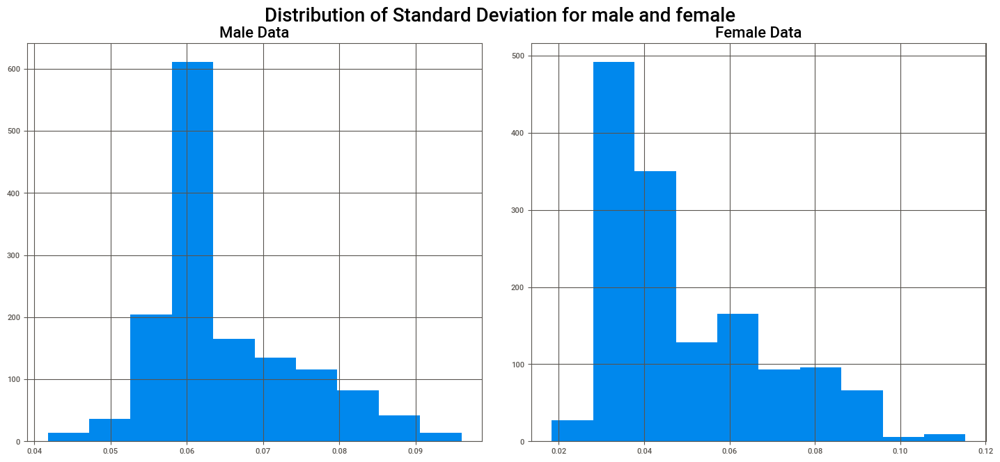

In [16]:
bi_variate('sd','Distribution of Standard Deviation for male and female')

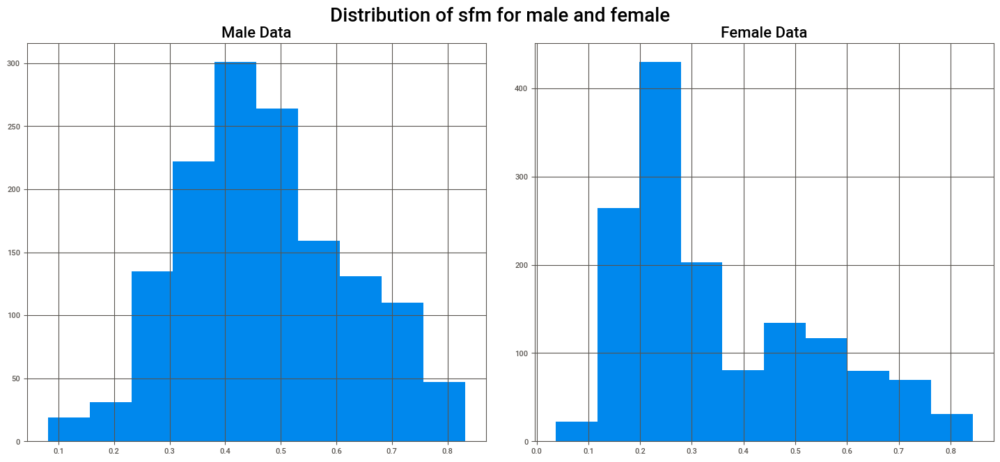

In [17]:
bi_variate('sfm','Distribution of sfm for male and female')

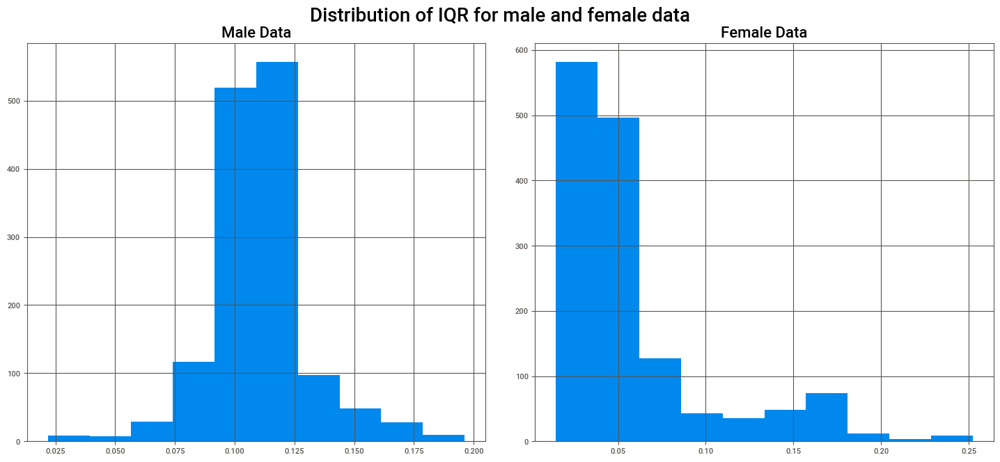

In [18]:
bi_variate('IQR','Distribution of IQR for male and female data')

- **SD,IQR and sfm**  of male population appears to be normally distributed whilst for female data it is **skewed** to the right

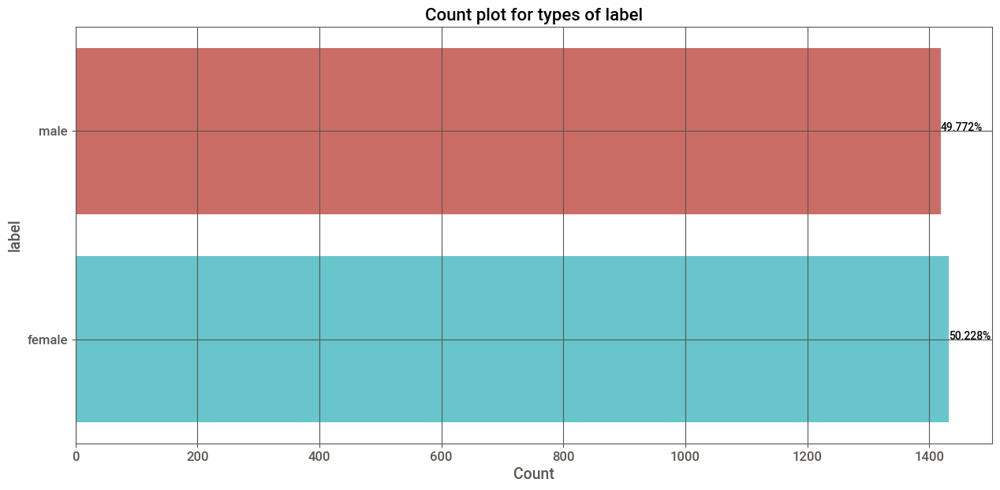

In [20]:
# Create a figure of 15 x 7 inches
fig = plt.figure(figsize=(15, 7))

# Create a countplot for Type feature
ax = sns.countplot(y='label', data=train_data, palette='hls')

# Adding percentages to the bars
total = train_data.shape[0]
for p in ax.patches:
    percentage = '{:.3f}%'.format(100 * p.get_width() / total)
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y))

# Adding some cosmetics
plt.yticks(size=12)
plt.xticks(size=12)
plt.xlabel(xlabel="Count", size=14)
plt.ylabel(ylabel='label', size=14)
plt.title(label="Count plot for types of label", size=16)
plt.grid(b=True)

# Display the output
plt.show()


- We have equal representation of male and female data the dataset appears **balanced**

{'whiskers': [<matplotlib.lines.Line2D at 0x7f811e21c730>,
 'caps': [<matplotlib.lines.Line2D at 0x7f811e21c280>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f811e21ceb0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f811e238670>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f811e238e80>],
 'means': []}

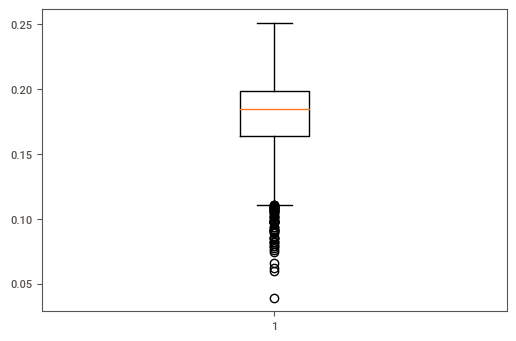

In [21]:
plt.boxplot(x='meanfreq',data=train_data)

- Outliers exists in mean frequency

# Bivariate Analysis

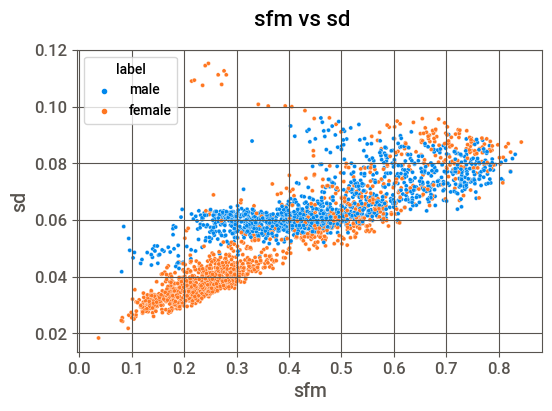

In [14]:
#sns.jointplot(x='sfm', y='sd', kind="hex", color="#4CB391", data=train_data, size=5)
sns.scatterplot(x='sfm', y='sd', hue='label', data=train_data)
# Add cosmetics
plt.xlabel(xlabel='sfm', fontsize=14)
plt.ylabel(ylabel='sd', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.suptitle(t='sfm vs sd', fontsize=16)
plt.grid(b=True)

  # Display the output
plt.show()

# **Observation**-:
sfm has a strong positive correlation with sd

<AxesSubplot:xlabel='centroid', ylabel='sfm'>

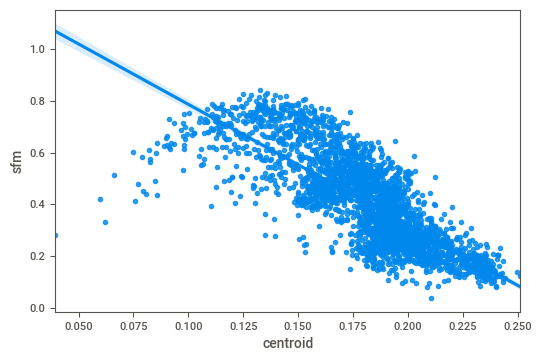

In [34]:
sns.regplot(x='centroid',y='sfm',data=train_data)

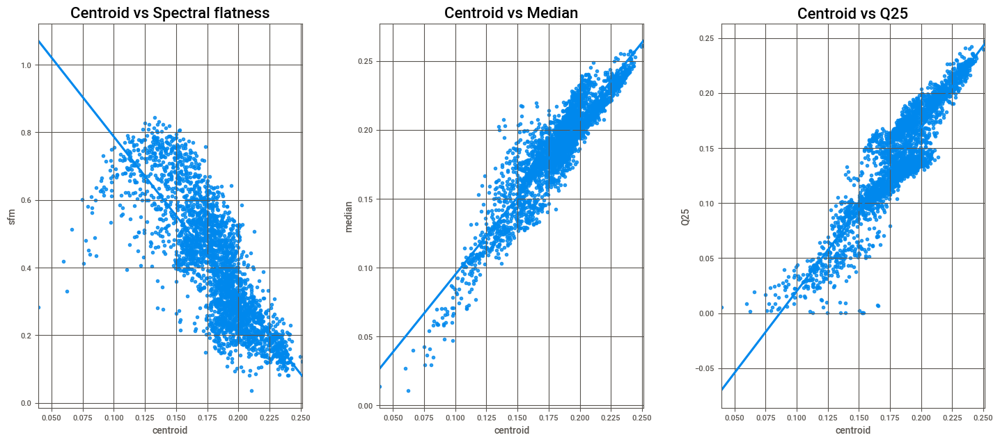

In [40]:
# Instantiate a figure of size of 15 x 7 inches with 6 subplots
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 7))

# Create plots
sns.regplot(x='centroid', y='sfm', data=train_data, ax=ax[0], ci=None,label='maka')
sns.regplot(x='centroid', y='median', data=train_data, ax=ax[1], ci=None)
sns.regplot(x='centroid', y='Q25', data=train_data, ax=ax[2], ci=None)
# Adding some cosmetics - labels, title and grid.
ax[0].set_title(label='Centroid vs Spectral flatness', fontsize=16)
ax[1].set_title(label='Centroid vs Median', fontsize=16)
ax[2].set_title(label='Centroid vs Q25', fontsize=16)
for axes in ax:
  axes.grid(b=True)

# Setting a super title for the plots

plt.tight_layout(pad=3)

# Display the figures
plt.show()

# **Observation**-:
While centroid exhibits a **strong positive** correlation with median and Q25 values it exhibit a **negative correlation** with sfm and spectral flatness

# Multivariate Analysis

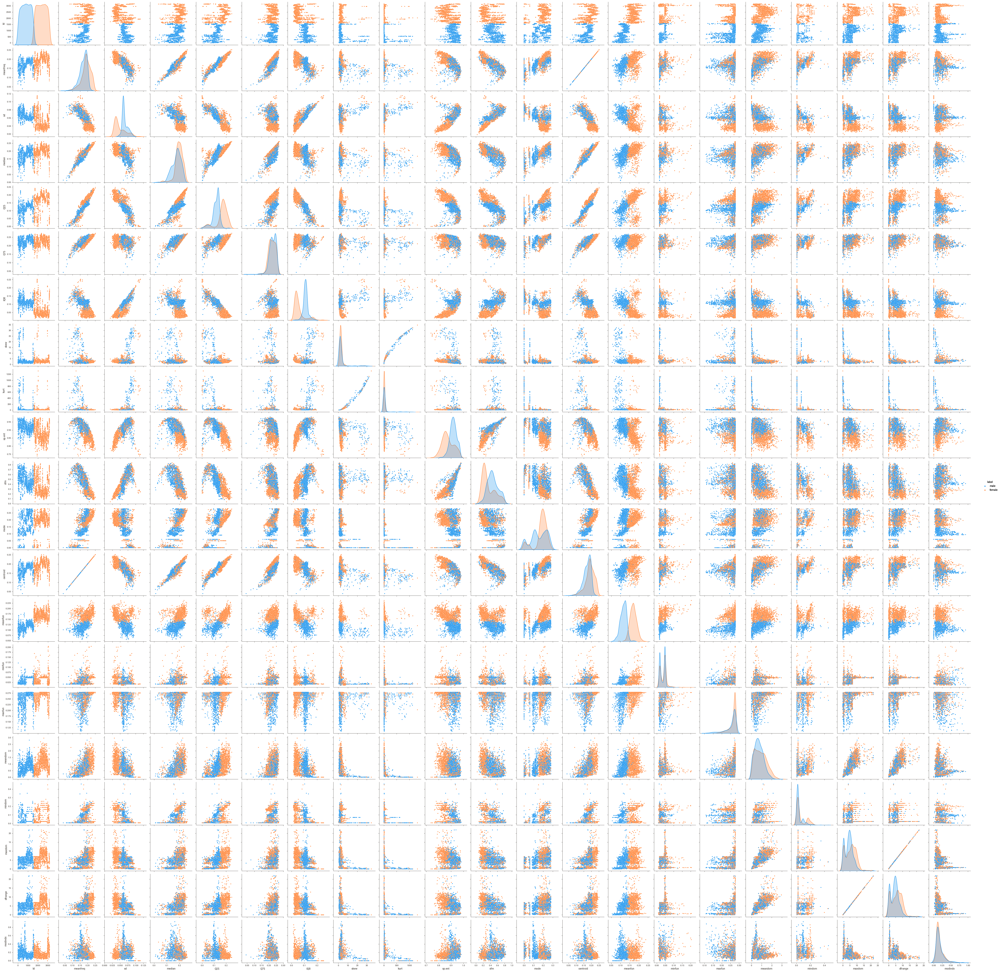

In [22]:
sns.pairplot(train_data,diag_kind='kde', hue='label')

Text(0.5, 1.0, 'Correlation between features')

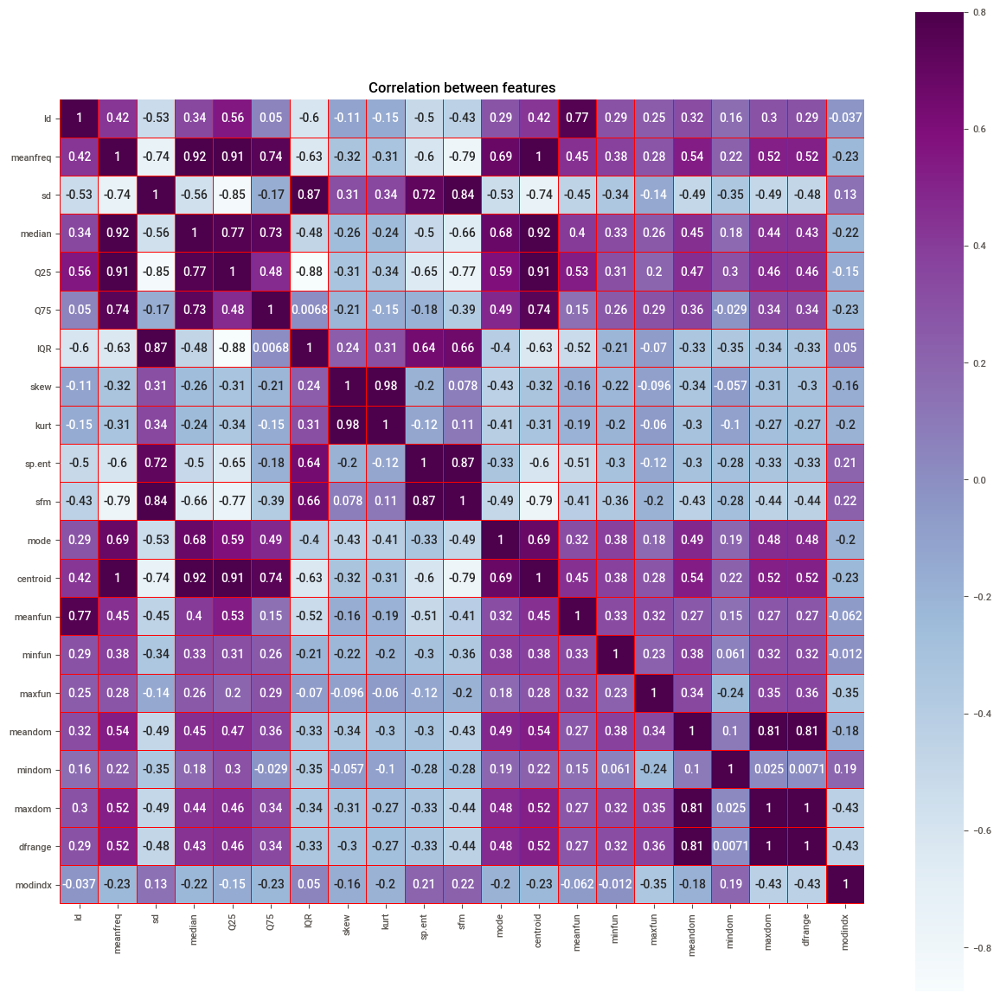

In [23]:
corr = train_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='BuPu',linecolor ='red')
plt.title('Correlation between features')

<a name = Section7></a>

---
# **7. Post Data Processing**
---



<a name = Section71></a>
### **7.1 Data Encoding**

- In this section, we will encode our categorical features such as Sex, Embarked, Title using one hot encoding.

In [24]:
train_data = train_data.drop(labels=['Id'], axis=1)
train_data = pd.get_dummies(data=train_data, columns=['label'])
# Gendercolumn is dropped
# We want Male =0 and Female =1 So we drop Male column here
train_data = train_data.drop(["label_female"], axis=1) 
# Rename the Column
train_data = train_data.rename(columns={"label_male": "label"})
train_data.head(2)

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.162337,0.058206,0.174065,0.100225,0.196512,0.096287,2.127226,7.815129,0.921533,0.426868,0.195134,0.162337,0.095852,0.016754,0.235294,0.406033,0.046875,3.484375,3.437500,0.155348,1
1,0.161653,0.057435,0.170138,0.157522,0.182929,0.025407,6.968850,60.968047,0.870409,0.459881,0.171014,0.161653,0.163486,0.015601,0.204082,0.595161,0.170898,3.979492,3.808594,0.209073,0


<a name = Section72></a>
### **7.2 Data Scaling**

- In this section, we will scale our features to ensure that it one feature doesn't have more impact than others in terms of weights.

In [25]:
X = train_data.drop(labels=['label'], axis=1)
y = train_data['label']
# Instatiate a scaler object and performing transformation on age and fare
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)
X = pd.DataFrame(data=scaled_data, columns=X.columns.to_list())
X.shape

(2851, 20)

In [31]:
# drop the id column from test data
test_data = test_data.drop(labels=['Id'], axis=1)

In [32]:
#Scaling the test data
scaled_data = scaler.fit_transform(test_data)
test_data= pd.DataFrame(data=scaled_data, columns=test_data.columns.to_list())
test_data.shape

(317, 20)

<a name = Section73></a>
### **7.3 Data Preparation**

- Now we will **split** our **data** into **dependent** and **independent** variables for further development.

In [27]:
# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)

# Display the shape of training and testing data
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

X_train shape:  (2280, 20)
y_train shape:  (2280,)
X_test shape:  (571, 20)
y_test shape:  (571,)


<a name = Section8></a>

---
# **8. Model Development & Evaluation**
---

- In this section we will **develop Decision Tree model** 

- Then we will **analyze the results** obtained and **make our observations**.

- For **evaluation purpose** we will **focus** on **Precision**, **Recall** and **Accuracy** scores.

- We will do **hyperparameter tuning** and see if the scores improves. 


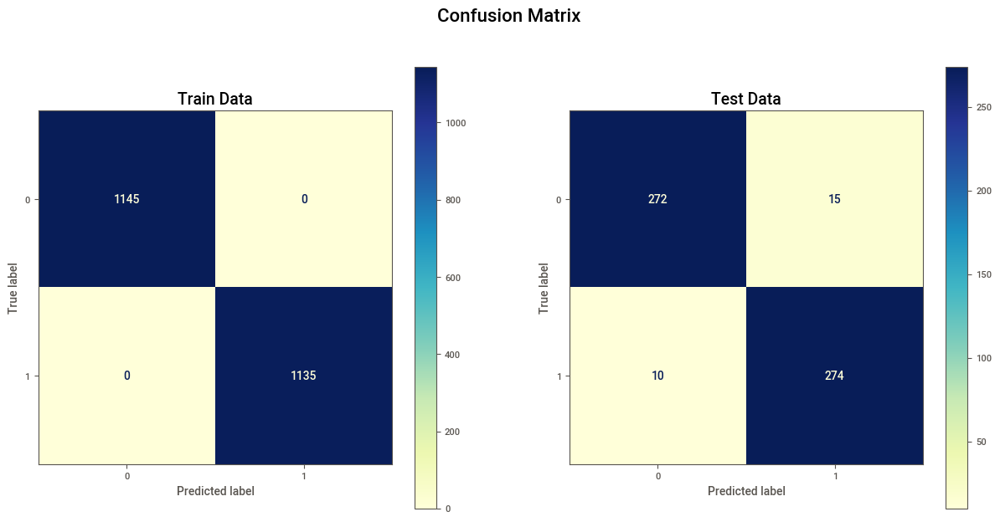

In [28]:
# Instantiate a decision tree classifier
dtc = DecisionTreeClassifier(random_state=42, class_weight='balanced')
dtc.fit(X_train, y_train)

# Predicting training and testing labels
y_train_pred_count = dtc.predict(X_train)
y_test_pred_count = dtc.predict(X_test)

# Plotting confusion maxtrix of train and test data
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=(15, 7))
plot_confusion_matrix(estimator=dtc, X=X_train, y_true=y_train, values_format='.5g', cmap='YlGnBu', ax=ax1)
plot_confusion_matrix(estimator=dtc, X=X_test, y_true=y_test, values_format='.5g', cmap='YlGnBu', ax=ax2)
ax1.set_title(label='Train Data', size=14)
ax2.set_title(label='Test Data', size=14)
ax1.grid(b=False)
ax2.grid(b=False)
plt.suptitle(t='Confusion Matrix', size=16)
plt.show()

**Observation:**

- **Train Data:**
  - Model predicted **1145 instances correctly** for **negative class** while **1135 instances** were predicted **correctly** for **positive class**.
 
- **Test Data:**
  - Model predicted **272 instances correctly** for **negative class** while **274 instances** were predicted **correctly** for **positive class**.
  - Model **identified 10 instance negative but in actual** it **was positive**.
  - Model **identified 15 instances positive but in actual** they **were negative**.

In [29]:
train_report = classification_report(y_train, y_train_pred_count)
test_report = classification_report(y_test, y_test_pred_count)
print('                    Training Report          ')
print(train_report)
print('                    Testing Report           ')
print(test_report)

                    Training Report          
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1145
           1       1.00      1.00      1.00      1135

    accuracy                           1.00      2280
   macro avg       1.00      1.00      1.00      2280
weighted avg       1.00      1.00      1.00      2280

                    Testing Report           
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       287
           1       0.95      0.96      0.96       284

    accuracy                           0.96       571
   macro avg       0.96      0.96      0.96       571
weighted avg       0.96      0.96      0.96       571



- The accuracy score is **0.96** for testing data

In [33]:
test_pred_count = dtc.predict(test_data)

In [39]:
store_id.count()

317

In [35]:
data = {'ID':store_id,
        'label':test_pred_count}
 
# Create DataFrame
df = pd.DataFrame(data)

In [36]:
df.head()

,ID,label
0,2148,0
1,1124,1
2,170,1
3,3158,0
4,2229,0


In [37]:
df.to_csv('submission.csv', index=False, header=False)# exporting the submission file

**Observations:**

- We can observe that we **model** is **performing well** on **training data** and on **testing set** 



<a name = Section9></a>

---
# **9. Summarization**
---

<a name = Section91></a>
### **9.1 Conclusion**

- The high accuracy of the model enables the company to automate the laboriuous and tedious task of manually classifying the gender of the customer.




<a name = Section92></a>
### **9.2 Actionable Insights**

- With more incoming data the ML algorith can imporve its accuracy over the time and classify the gender of customer based on its voice
- Company may endeavour to have voice samples from various ethnicities 